# <u>EDA and Feature Engineering on Raw Data</u>


As a first step in building our movie recommendation system, we explore the raw dataset to better understand its structure and content. This notebook provides an overview of the key variables, identifies potential issues in the raw files, and highlights aspects of the data that require processing. In addition to this exploratory analysis, we apply feature engineering techniques to extract or construct new variables that can enhance the quality of our recommendations, ensuring that both data understanding and transformation are integrated from the start of the project.

## <u>0. Kaggle information:</u>

The dataset describes user rating activity from MovieLens([Kaggle Source](https://www.kaggle.com/datasets/grouplens/movielens-20m-dataset?resource=download)
), a movie recommendation service. It contains **20,000,263 ratings** associated with **27,278 movies**. These data were created by **138,493 users** between **January 9, 1995 and March 31, 2015**, and the dataset was generated on **October 17, 2016**.  
Users were selected at random for inclusion, and all selected users had rated at least **20 movies**. No demographic information is included and each user is represented by a unique `userId`.

For the purposes of this project, **movie metadata, user ratings, and genome scores were downloaded and retained**, while auxiliary information such as free-text tags and external identifiers was excluded.

The dataset therefore consists of **four files**:

### `ratings.csv`
Contains ratings of movies by users.

- `userId`: identifier of the user  
- `movieId`: identifier of the movie  
- `rating`: user-assigned score for a movie, ranging from 0.5 to 5.0 in steps of 0.5  
- `timestamp`: time at which the rating was recorded  

### `movies.csv`
Contains basic movie information.

- `movieId`: identifier of the movie  
- `title`: movie title  
- `genres`: pipe-separated list of genres  

### `genome_scores.csv`
Contains movie-tag relevance information used for content-based filtering.

- `movieId`: identifier of the movie  
- `tagId`: identifier of the tag  
- `relevance`: score from 0 to 1 indicating how strongly the tag applies to the movie  

### `genome_tags.csv`
Contains descriptions of the tags used in `genome_scores.csv`.

- `tagId`: identifier of the tag  
- `tag`: textual description of the tag


## <u>1. Import data and first insights on the datasets</u>

In [95]:
# Import necessary libraries
import pandas as pd, numpy as np, os, sys, seaborn as sns, matplotlib.pyplot as plt
import bar_chart_race as bcr
from IPython.display import Image
import matplotlib.dates as mdates
from wordcloud import WordCloud
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.ticker as mticker


# Remove Userwarning
import warnings
warnings.filterwarnings("ignore")


# Set the working directory
current_dir = os.getcwd()

project_root = os.path.abspath(os.path.join(current_dir, ".."))
if project_root not in sys.path:
    sys.path.append(project_root)

# Import module for data processing
from modules.data_analysis import *


In [2]:
# Import dataset
ratings_df = pd.read_csv('../data/raw/ratings.csv', parse_dates=["timestamp"])
movies_df = pd.read_csv('../data/raw/movies.csv')
genome_scores_df = pd.read_csv('../data/raw/genome_scores.csv')
genome_tags_df = pd.read_csv('../data/raw/genome_tags.csv')


To manage memory usage while keeping evaluation sets large enough, we randomly sample 6,000 users from the pool of all users, ensuring that different types of models can be compared without running into memory issues.


In [3]:
# Sample 6000 distinct users from the dataset
all_distinct_users = ratings_df['userId'].unique()
np.random.seed(12)
selected_users = np.random.choice(all_distinct_users,size = 6000, replace = False)
ratings_df = ratings_df[ratings_df['userId'].isin(selected_users)]

### <u>1.1 ratings.csv</u>

As shown in the summary below, all columns appear clean and properly formatted, with no missing values or duplicates.

- `userId` and `movieId` will be used for joining datasets and constructing the interaction structure for modeling.
- `rating` serves as the main feedback signal across the differnt collaborative filtering models.
- `timestamp`, while currently unused, may contain underlying patterns that could influence user behavior or rating trends.

Later in this notebook, we will examine whether the timestamp column reflects any systematic patterns, such as rating inflation over time or shifts in rating behavior across different user cohorts. If such trends are detected, we will consider extracting temporal features to enrich the model. Otherwise, the column will be safely removed.



In [4]:
ratings_df.head(3)

,userId,movieId,rating,timestamp
3225,27,11,4.0,2005-03-31 04:36:25
3226,27,29,3.0,2005-03-31 04:39:31
3227,27,47,4.5,2005-03-31 04:34:52


In [5]:
# Display basic statistics of the 'rating' column
ratings_df['rating'].describe()

count    876180.000000
mean          3.504395
std           1.062094
min           0.500000
25%           3.000000
50%           3.500000
75%           4.000000
max           5.000000
Name: rating, dtype: float64

In [6]:
_ = data_quality_summary(ratings_df, 'ratings_df')


DATA QUALITY REPORT: ratings_df

BASIC INFO:
  Rows: 876,180
  Columns: 4
  Memory Usage: 33.42 MB

 COLUMN SUMMARY:
                     Type  Non-Null  Null  Null %  Unique  Unique %
userId              int64    876180     0     0.0    6000      0.68
movieId             int64    876180     0     0.0   15360      1.75
rating            float64    876180     0     0.0      10      0.00
timestamp  datetime64[ns]    876180     0     0.0  694433     79.26

 DUPLICATES:
  Total duplicate rows: 0 (0.00%)




### <u>1.2 movies.csv</u>

From a quick analysis of the dataset, we observe that there are no missing values or duplicate rows.  
- `title`: While the title column does not provide additional modeling value beyond the movieId, it will be useful later for interpretation and visualization of the results.    
- `genre`: The genre will play a key role for the content-based filtering models. Given its multi-label nature, we will later process it either through multi-hot encoding or by expanding each movie into multiple rows, each associated with a single genre.

In [7]:
movies_df.head(3)

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance


In [8]:
movies_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27278 entries, 0 to 27277
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  27278 non-null  int64 
 1   title    27278 non-null  object
 2   genres   27278 non-null  object
dtypes: int64(1), object(2)
memory usage: 639.5+ KB


### <u>1.3 genome_scores.csv</u>

From the quality data assessment, no missing values or duplicates are present. The dataframe assigns 10,381 tags to the movies, each with a corresponding relevance score. This will be useful later for the content-based models but will require careful attention when filtering movies or ratings, as the row number can be reduced due to the exclusion of those movies.

In [9]:
genome_scores_df.head(3)

,movieId,tagId,relevance
0,1,1,0.02500
1,1,2,0.02500
2,1,3,0.05775


In [10]:
_ = data_quality_summary(genome_scores_df, 'genome_scores_df')


DATA QUALITY REPORT: genome_scores_df

BASIC INFO:
  Rows: 11,709,768
  Columns: 3
  Memory Usage: 268.02 MB

 COLUMN SUMMARY:
              Type  Non-Null  Null  Null %  Unique  Unique %
movieId      int64  11709768     0     0.0   10381      0.09
tagId        int64  11709768     0     0.0    1128      0.01
relevance  float64  11709768     0     0.0    4000      0.03

 DUPLICATES:
  Total duplicate rows: 0 (0.00%)




### <u>1.3 genome_tags.csv</u>

The dataframe links each `tagId` in `genome_scores.csv` to its corresponding `tag` in `genome_tags.csv`. Its use will be primarily for exploratory data analysis, as it provides explanatory power to understand the themes and descriptors associated with each movie.

In [11]:
genome_tags_df.head(3)

,tagId,tag
0,1,007
1,2,007 (series)
2,3,18th century


In [12]:
_ = data_quality_summary(genome_tags_df, 'genome_tags_df')


DATA QUALITY REPORT: genome_tags_df

BASIC INFO:
  Rows: 1,128
  Columns: 2
  Memory Usage: 0.08 MB

 COLUMN SUMMARY:
         Type  Non-Null  Null  Null %  Unique  Unique %
tagId   int64      1128     0     0.0    1128     100.0
tag    object      1128     0     0.0    1128     100.0

 DUPLICATES:
  Total duplicate rows: 0 (0.00%)




## <u>2. Explanatory analysis</u>

### <u> 2.0 Distribution of the Number of Ratings per Movie:</u>

Before proceeding with the explanatory analysis, it is important to first examine the distribution of rating counts across movies. While users with fewer than 20 reviews have already been filtered out to ensure reliable reviewers, the dataset still includes many movies with very few ratings, which can negatively influence their average score and introduce noise. Therefore, gaining an overview of how many ratings each movie has allows us to determine an appropriate minimum threshold for inclusion in our study. This step ensures that subsequent analyses and models are built on a solid foundation of movies with sufficient audience feedback.

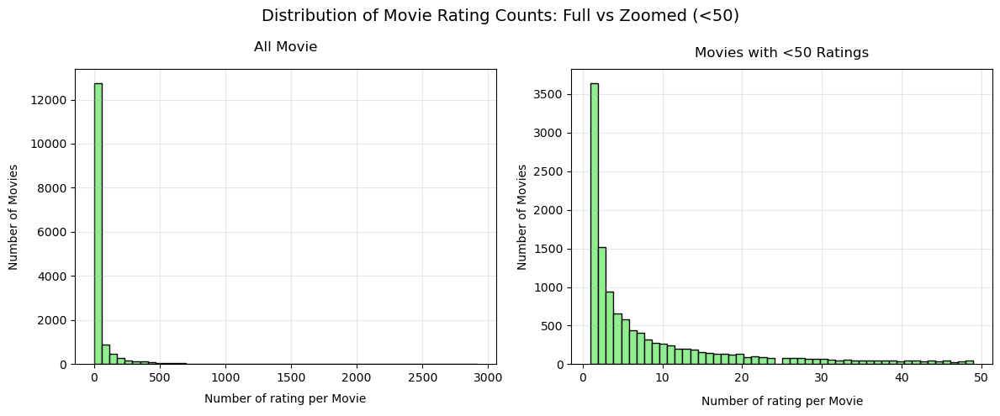

In [13]:
movie_ratings_count = ratings_df[['movieId', 'rating']].groupby('movieId').count()
movie_ratings_count = movie_ratings_count.reset_index().rename(columns={'rating': 'rating_count'})
hist_50 = movie_ratings_count[movie_ratings_count['rating_count']<50]

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
fig.suptitle('Distribution of Movie Rating Counts: Full vs Zoomed (<50)', fontsize=14)

ax1.hist(movie_ratings_count['rating_count'], bins=50, edgecolor='black', color='lightgreen')
ax1.set_title('All Movie', pad=15)
ax1.set_xlabel('Number of rating per Movie', labelpad=8)
ax1.set_ylabel('Number of Movies', labelpad=8)
ax1.grid(alpha=0.3)

ax2.hist(hist_50['rating_count'], bins=50, edgecolor='black', color='lightgreen')
ax2.set_title('Movies with <50 Ratings', pad=10)
ax2.set_xlabel('Number of rating per Movie', labelpad=10)
ax2.set_ylabel('Number of Movies')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [14]:
movie_ratings_count['rating_count'].describe()

count    15360.000000
mean        57.042969
std        174.187514
min          1.000000
25%          2.000000
50%          6.000000
75%         30.000000
max       2914.000000
Name: rating_count, dtype: float64

<u>Comment:</u>   

Both the histograms and the summary table demonstrate that the vast majority of movies have very few ratings, confirming a highly skewed distribution with many niche titles. To ensure the reliability of our analysis and model training, we set a minimum threshold of 10 ratings per movie. This threshold strikes a balance between excluding movies with too little feedback (which could lead to noisy or unreliable results), while still retaining a diverse selection of niche titles. By doing so, we ensure that the dataset includes only movies with sufficient audience input, supporting more stable predictions and meaningful recommendations especially in the user–user collaborative filtering model.

#### <u>2.0.1 Cleaning ratings_df given threshold of rating count</u>

In [15]:
# Identify movieId with less than 40 reviews
movieId_keep = movie_ratings_count[movie_ratings_count['rating_count']>=10]['movieId']
ratings_df_f = ratings_df[ratings_df['movieId'].isin(movieId_keep)].copy()

num_ratings =  len(ratings_df)
num_ratings_f = len(ratings_df_f)

num_movies = ratings_df['movieId'].nunique()
num_movies_f = ratings_df_f['movieId'].nunique()



print('Original number of ratings:', num_ratings)
print('Filtered number of ratings:', num_ratings_f)
print(f'Number of rating removed: {num_ratings-num_ratings_f} ({((1 - num_ratings_f/num_ratings)*100):.2f}%)')
print('')
print('Original number of movies:', num_movies)
print('Filtered number of movies:', num_movies_f)
print(f'Number of movies removed: {num_movies-num_movies_f} ({((1- num_movies_f/num_movies)*100):.2f}%)')

Original number of ratings: 876180
Filtered number of ratings: 850580
Number of rating removed: 25600 (2.92%)

Original number of movies: 15360
Filtered number of movies: 6571
Number of movies removed: 8789 (57.22%)


<u>Comment:</u>  

Despite setting a minimum threshold of 10 ratings per movie, we removed only a small fraction of the total ratings (~3%) while eliminating a substantial number of movies. This filtering step removes many movies that lack sufficient feedback for accurate recommendations, reducing noise from niche titles with high-variance ratings, while still retaining enough rare movies for cold-start evaluation. As a result, the remaining dataset is much better suited for robust model training and more reliable evaluation of movie quality.

### <u>2.1 Average Rating Distribution</u>

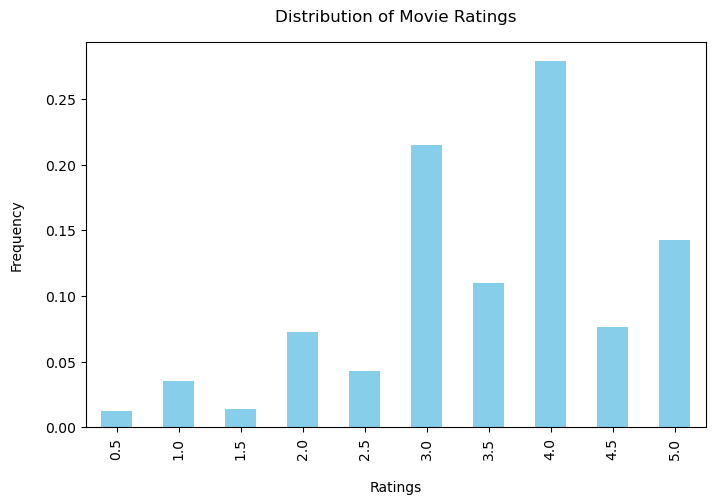

In [16]:
# Build bar plot for the rating distribution
plt.figure(figsize=(8, 5))
rating_counts = ratings_df_f['rating'].value_counts(normalize=True).sort_index()
rating_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Movie Ratings', pad=15)
plt.xlabel('Ratings', labelpad=15)
plt.ylabel('Frequency', labelpad=15)
plt.xticks(rotation=90)
plt.show()


<u>Comment:</u>

As we can observe from the bar plot, there is a noticeable skew toward higher ratings, with 4.0 being the most frequent. This likely reflects a combination of psychological tendencies and selection bias. One possible explanation is that users tend to rate movies they enjoyed, while avoiding those they disliked or found forgettable. Additionally, a rating of 3.0, although numerically near the midpoint of the scale, often reflects a neutral or indifferent opinion rather than a truly positive one. This distinction should be considered in the implementation of the recommendation system, for example by treating ratings ≥ 4.0 as positive (worth recommending) and those ≤ 3.5 as negative or neutral.

### <u>2.2 Users activities</u>

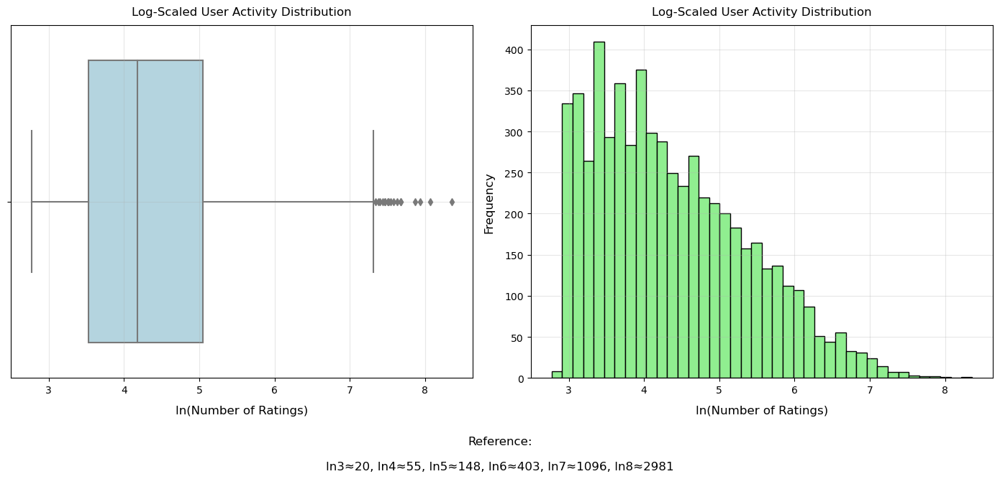

In [17]:
# Compute user activity
user_rating_counts = ratings_df_f['userId'].value_counts()
log_counts = np.log(user_rating_counts)

# Plot histogram and boxplot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Boxplot
sns.boxplot(x=log_counts, ax=axes[0], color='lightblue')
axes[0].set_title('Log-Scaled User Activity Distribution', pad=10)
axes[0].set_xlabel('ln(Number of Ratings)', labelpad=10, fontsize=12)
axes[0].set_ylabel('')
axes[0].grid(alpha=0.3)

# Histogram
axes[1].hist(log_counts, bins=40, color='lightgreen', edgecolor='black')
axes[1].set_title('Log-Scaled User Activity Distribution', pad=10)
axes[1].set_xlabel('ln(Number of Ratings)', labelpad=10, fontsize=12)
axes[1].set_ylabel('Frequency', labelpad=10, fontsize=12)
axes[1].grid(alpha=0.3)

plt.tight_layout()

# Reference log values
plt.figtext(0.5, -0.1,  
            "Reference:\n\n"
            "ln3≈20, ln4≈55, ln5≈148, ln6≈403, ln7≈1096, ln8≈2981",
            ha='center', fontsize=12)


plt.show()


In [18]:
print(f'Summary user activity distribution:\n'
      f'mean: {user_rating_counts.mean():.2f}\n'
      f'median: {user_rating_counts.median():.2f}\n'
      f'std : {user_rating_counts.std():.2f}\n'
      f'min : {user_rating_counts.min():.2f}\n'
      f'max : {user_rating_counts.max():.2f}\n')

Summary user activity distribution:
mean: 141.76
median: 65.00
std : 215.70
min : 16.00
max : 4256.00



<u>Comment:</u>

From the histogram, boxplot, and summary statistics, we can see that user activity is strongly right-skewed, with a small number of users giving a very large number of reviews compared to the rest. To better visualize this pattern, a log transformation was applied to reduce the spread and make the long tail easier to interpret. Due to the previous filtering and cleaning steps, the minimum number of ratings per user has dropped below 20, which can make training unstable for certain users. To address this, a final filtering step will be applied to retain only users with at least 20 ratings after all cleaning is complete. This helps reduce noise and ensures that only users with meaningful contributions are included. 

<br>

### <u> 2.3 Insights on genres <u>

In [19]:
# First we split the genres (..|..|..) into a list of genres
movies_df['genre_list'] = movies_df['genres'].str.split('|')

# Explode the genre_list to have one genre per row
movies_exploded = movies_df.explode('genre_list')

# Merge movies_exploded with ratings_df_f to get the ratings for each genre
rating_genre_df = pd.merge(ratings_df_f,movies_exploded[['movieId', 'genre_list']], on = 'movieId', how='left')
rating_genre_df.head(3)

,userId,movieId,rating,timestamp,genre_list
0,27,11,4.0,2005-03-31 04:36:25,Comedy
1,27,11,4.0,2005-03-31 04:36:25,Drama
2,27,11,4.0,2005-03-31 04:36:25,Romance


In [20]:
# Count distinct genre across all movies
print(f"The database contains {rating_genre_df['genre_list'].nunique()} unique genres.")

The database contains 19 unique genres.


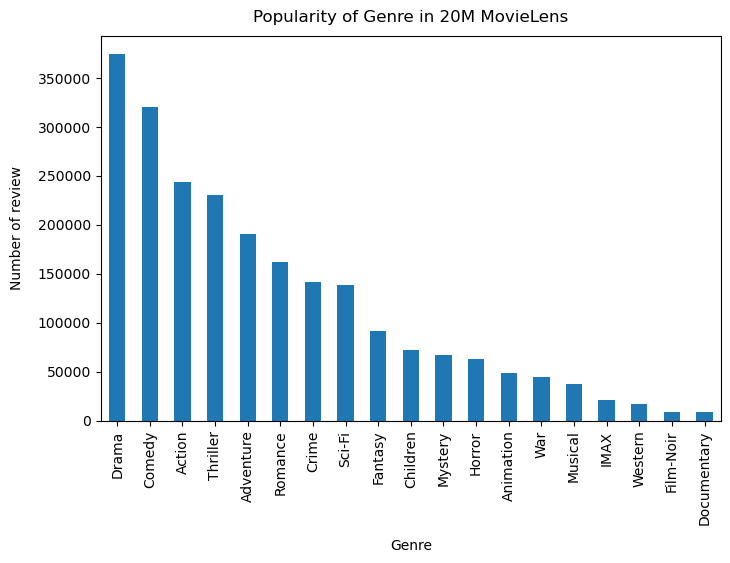

In [21]:
# Count number of review for each genre
genre_counts_bar = rating_genre_df['genre_list'].value_counts().sort_values(ascending=False)

# Plot bar-plot
plt.figure(figsize=(8,5))
genre_counts_bar.plot(kind='bar')
plt.xlabel('Genre', labelpad=10)
plt.ylabel('Number of review', labelpad=10)
plt.title('Popularity of Genre in 20M MovieLens', pad=10)
plt.show()

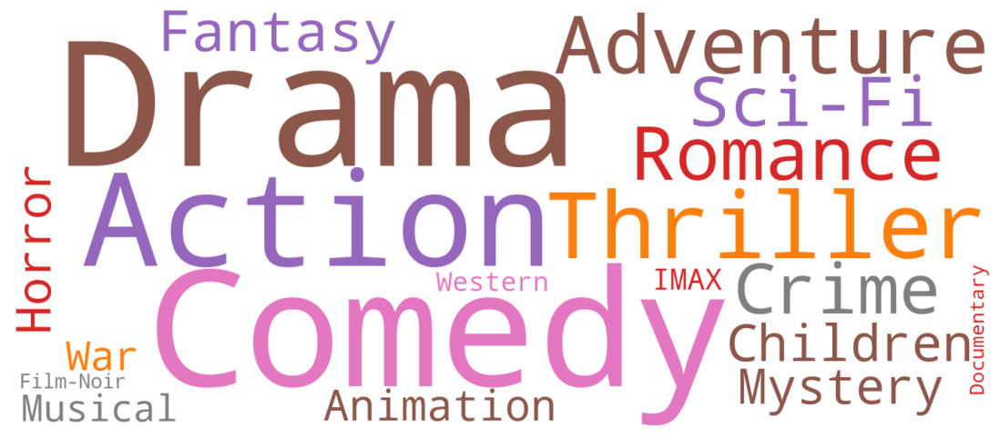

In [22]:
# Build WordCloud plot

# Convert genre_counts_bar into a dictionary
freq_dictionary = genre_counts_bar.to_dict()

# Build WordCloud
wordcloud = WordCloud(width=1400, height=600, background_color='white', colormap='tab10').generate_from_frequencies(freq_dictionary)

# Plot
plt.figure(figsize=(14,6))
plt.imshow(wordcloud.to_image(), interpolation='bilinear')
plt.axis('off')
plt.savefig('images/genre_wordcloud.png', dpi=300, bbox_inches='tight')
plt.show()

<u> Comment: </u>

As observed in both the bar plot and the word cloud, the distribution of reviews across genres is highly skewed, with a strong concentration in the most popular genres, as expected. The total number of distinct genres is relatively small (about 19), which is advantageous for future feature engineering: approaches such as one-hot encoding can be applied effectively without creating an excessively large or sparse matrix.

#### <u> 2.3.1 Top 10 highest rated genre </u>


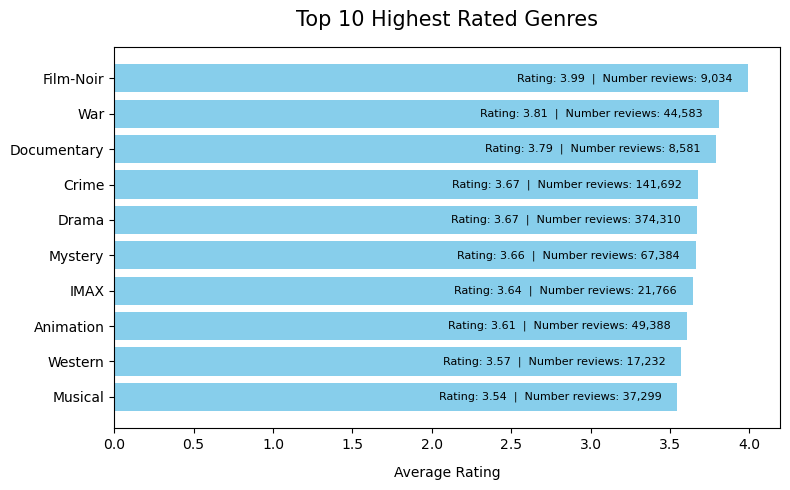

In [23]:
# Find the top 10 highest rated genres and the number of reviews for each genre
top_genres = rating_genre_df.groupby('genre_list')['rating'].agg(['mean', 'count']).sort_values(by='mean', ascending=False).head(10)

fig, ax = plt.subplots(figsize = (8,5))

# Barplot for the top 10 genres
bars = ax.barh(top_genres.index, top_genres['mean'], color='skyblue')
ax.invert_yaxis()

# Add info inside the bar
for bar,count in zip(bars, top_genres['count']):
    # width = averagerating 
    width = bar.get_width()
    ax.text(
        width - 0.1,
        bar.get_y() + bar.get_height() / 2,
        f'Rating: {width:.2f}  |  Number reviews: {int(count):,}',
        va='center',
        ha='right',
        color='black',
        fontsize=8
    )


ax.set_title('Top 10 Highest Rated Genres', fontsize=15, pad=15)
ax.set_xlabel('Average Rating', labelpad=10); ax.set_ylabel('')
plt.tight_layout()
plt.show()

<u> Comment: </u>

As expected, genres with fewer reviews tend to achieve higher average ratings compared to more popular genres. This phenomenon is largely driven by selection bias as niche genres are typically watched only by audiences who already have a strong interest in that specific type of content, leading to more favorable ratings. In contrast, popular genres attract a broader and more diverse audience with varying tastes and expectations, resulting in more critical and varied ratings. Additionally, niche genres may benefit from a smaller but more passionate fanbase, while mainstream genres face higher scrutiny from casual viewers who may not be as invested in the content.

#### <u>2.3.2 Popularity of Genres across time:</u>

In [24]:
# Convert timestamp to year-quarter
rating_genre_df['year_quarter'] = pd.to_datetime(rating_genre_df['timestamp']).dt.to_period('Q')

# Count the number of ratings per genre per quarter
genre_counts_per_quarter = rating_genre_df.groupby(['year_quarter', 'genre_list']).size().reset_index(name='count')

# Reframe dataset with quarters as row, genres as columns, and counts as values
bcr_df = genre_counts_per_quarter.pivot(index='year_quarter', columns='genre_list', values='count').fillna(0)

In [25]:
# Function to count the total number of reviews across all genres
def show_total_reviews(values, ranks):
    total = int(values.sum())
    return {
        'x': 0.95,
        'y': 0.20,
        's': f'Total Ratings: {total:,}',
        'ha': 'right',
        'va': 'center'
    }

# Manually format the index as quarter strings
bcr_df_formatted = bcr_df.copy()
bcr_df_formatted.index = bcr_df_formatted.index.to_series().apply(
    lambda x: f"Q{(x.month - 1) // 3 + 1} {x.year}"
)

In [26]:

# # Save plot into a GIF file
# bcr.bar_chart_race(
#     df=bcr_df_formatted,
#     filename='images/genre_popularity.gif',
#     orientation='h',
#     sort='desc',
#     n_bars=10,
#     fixed_order=False,
#     fixed_max=True,
#     steps_per_period=15,
#     interpolate_period=False,
#     period_length=800,
#     title='Top 10 Movie Genres by Number of Review Over Time',
#     bar_size=.95,
#     # period_fmt='%s',  # Remove this line completely
#     period_label={'x': .95, 'y': .30, 'ha': 'right', 'va': 'center'},
#     cmap='dark12',
#     period_summary_func=show_total_reviews,
#     filter_column_colors=True
# )

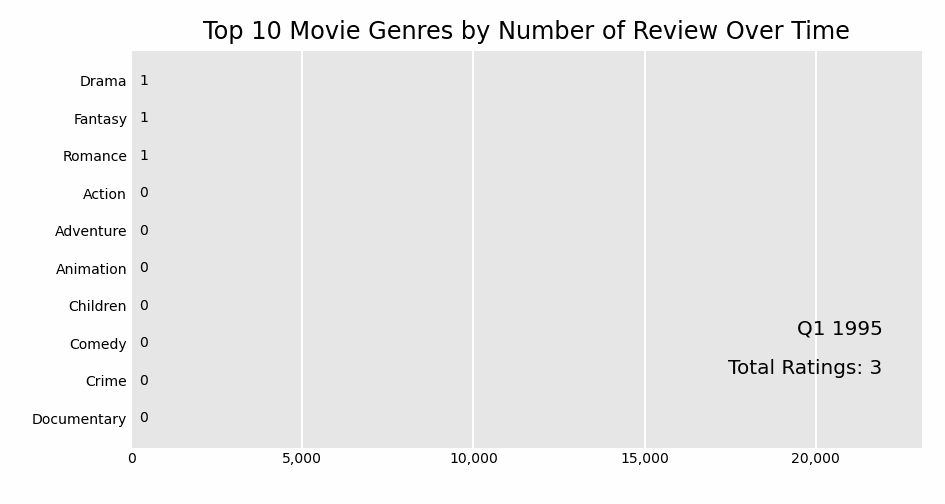

In [27]:
Image(filename='images/genre_popularity.gif')


<u>Comment:</u>

Over time, we observe a steady increase in the number of ratings, likely driven by the growing adoption of online platforms and the broader accessibility of movie content.  
In terms of genres, classic genres such as Drama, Comedy, and Action have consistently remained among the most popular, highlighting their long-standing appeal across different periods. By contrast, genres like Romance, Thriller, and Sci-Fi display temporary spikes in popularity, which may reflect shifting audience trends or the release of high-profile films. A particularly clear example is the recurring increase in Romance movie ratings during February, likely influenced by Valentine’s Day and the strategic release of themed films around that time.

### <u>2.4 How movies ages over time:</u>

In this final subsection of the exploratory data analysis, we examine how user interest and ratings evolve in relation to a movie’s age. Specifically, we look at the distribution of ratings across movies of different release years, to understand whether users tend to watch and rate mostly recent films or also engage with older ones. This analysis aims to uncover whether movies age well in terms of both popularity and perceived quality, or whether user engagement declines as time passes since their release.

#### <u>2.4.1 Distribution rating, interaction and movies over time</u>

In [28]:
# Merge rating information with movie information
rating_movies_df = pd.merge(ratings_df_f,movies_df, on='movieId', how='left')
# Extract release year from the title
rating_movies_df['release_year'] = pd.to_datetime(rating_movies_df['title'].str.extract(r'\((\d{4})\)')[0], format='%Y')
rating_movies_df = rating_movies_df[['userId', 'title', 'release_year', 'rating']]
rating_movies_df.head(3)

,userId,title,release_year,rating
0,27,"American President, The (1995)",1995-01-01,4.0
1,27,"City of Lost Children, The (Cité des enfants p...",1995-01-01,3.0
2,27,Seven (a.k.a. Se7en) (1995),1995-01-01,4.5


In [29]:
# Group by release year and compute number of distinct movies
yearly_movie_count = rating_movies_df.groupby('release_year')['title'].nunique().reset_index()
yearly_movie_count.rename(columns={'title': 'movie_count'}, inplace=True)
yearly_movie_count.head(3)

,release_year,movie_count
0,1915-01-01,1
1,1916-01-01,1
2,1920-01-01,1


In [30]:
# Group by release year and compute mean rating and count of ratings
yearly_rating = rating_movies_df.groupby('release_year')['rating'].agg(['mean', 'count']).reset_index()
yearly_rating.rename(columns={'mean': 'average_rating', 'count': 'rating_count'}, inplace=True)
yearly_rating['average_rating'] = yearly_rating['average_rating'].round(2)
yearly_rating.head(3)


,release_year,average_rating,rating_count
0,1915-01-01,3.30,10
1,1916-01-01,3.92,12
2,1920-01-01,3.80,48


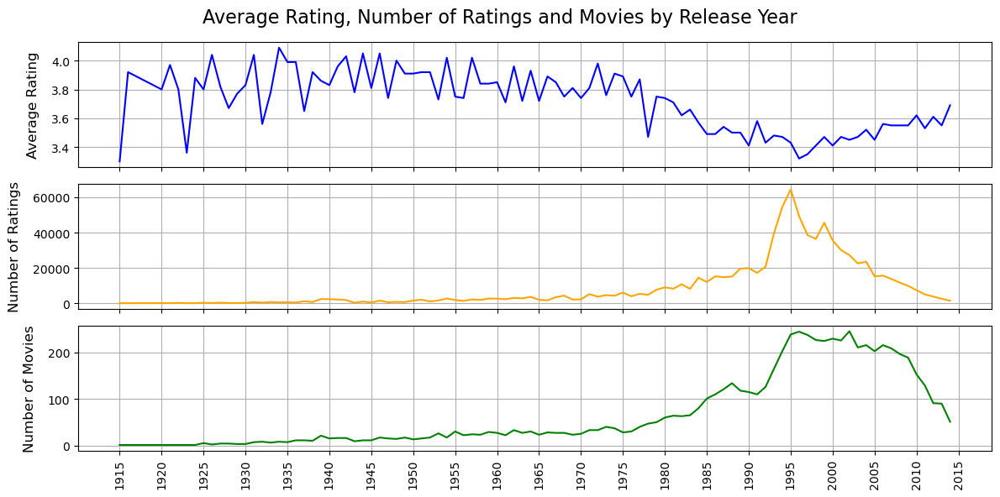

In [31]:
# Merge information across years
yearly_info = pd.merge(yearly_rating, yearly_movie_count, on='release_year', how='left')

# Plot the average rating, count of rating, and number of movies over the years
fig, axs = plt.subplots(3, 1, figsize=(12, 6), sharex=True)

# Average Rating plot
sns.lineplot(data=yearly_info, x='release_year', y='average_rating', ax=axs[0], color='blue')
axs[0].set_ylabel('Average Rating', fontsize=12, labelpad=10)
axs[0].grid()
axs[0].xaxis.set_major_locator(mdates.YearLocator(5))

# Number of Ratings plot
sns.lineplot(data=yearly_info, x='release_year', y='rating_count', ax=axs[1], color='orange')
axs[1].set_ylabel('Number of Ratings', fontsize=12, labelpad=10)
axs[1].grid()
axs[1].xaxis.set_major_locator(mdates.YearLocator(5))
axs[1].tick_params(axis='x', rotation=90)
axs[1].set_xlabel('')

# Number of Movies plot
sns.lineplot(data=yearly_info, x='release_year', y='movie_count', ax=axs[2], color='green')
axs[2].set_ylabel('Number of Movies', fontsize=12, labelpad=10)
axs[2].grid()
axs[2].xaxis.set_major_locator(mdates.YearLocator(5))
axs[2].tick_params(axis='x', rotation=90)
axs[2].set_xlabel('')


# Figure-level title
fig.suptitle('Average Rating, Number of Ratings and Movies by Release Year', fontsize=16)

plt.tight_layout()
plt.show()



<u>Comment:</u>

From the plots, several trends about the movie industry and user behavior emerge. First, there is an exponential increase in movie production over the years, accompanied by a general decline in average ratings. This does not mean all recent movies are worse, but rather that the average has dropped, likely due to a much greater volume of movies, including more lower-quality productions being released compared to the past.

The peak in user ratings between 1990 and 2000 is quite sharp, followed by a decline in future year which could be attributed to the rise of alternative platforms, shifts in audience behavior, or cultural changes in how people rate movies. For the most recent years, the apparent drop in both number of movies and ratings likely reflects incomplete data or insufficient time for new movies to accumulate ratings, rather than an actual decrease in production or popularity.

Lastly, the noisy pattern in average ratings before 1990 further highlights a limitation of using simple averages in movie recommendation systems, especially when the number of ratings and movies is low. In these early years, both the very small number of reviews per movie and the limited number of movies produced likely contribute to the volatility seen in the first plot.


#### <u>2.4.2 Distribution rating over decades</u>

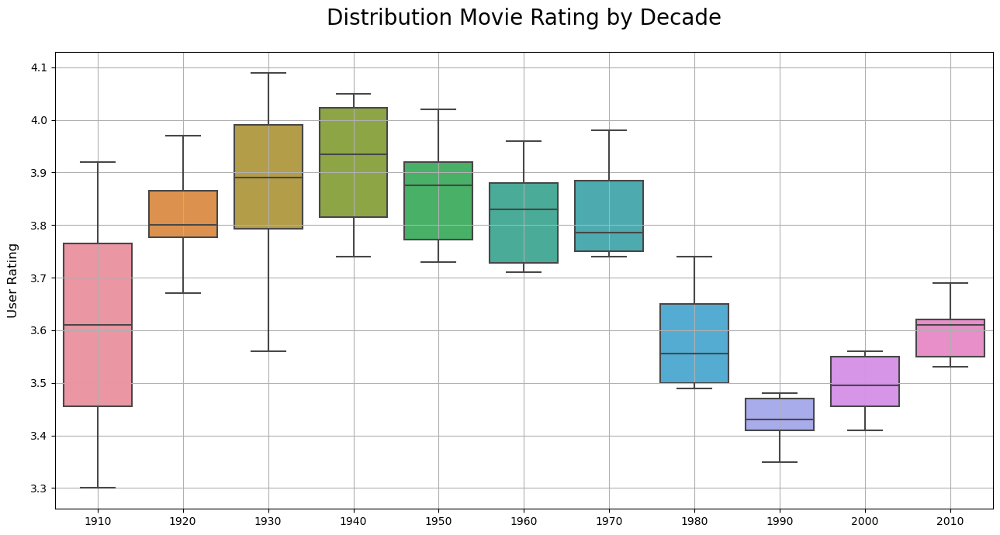

In [32]:
# Compute decade based on year
yearly_info['decade'] = (yearly_info['release_year'].dt.year // 10) * 10

plt.figure(figsize=(13,7))
sns.boxplot(data=yearly_info, x='decade', y='average_rating', showfliers=False)
plt.title('Distribution Movie Rating by Decade', fontsize=20, pad=25)
plt.xlabel('')
plt.ylabel('User Rating', fontsize = 12, labelpad= 10)
plt.tight_layout()
plt.grid()
plt.show()

In [33]:
# Compute total rating count and movie count and average rating per decade 
decade_info = yearly_info.groupby('decade').agg({
    'average_rating': 'mean',
    'rating_count': 'sum',
    'movie_count': 'sum'
    }).reset_index()

decade_info['average_rating'] = decade_info['average_rating'].round(2)

display(decade_info)


,decade,average_rating,rating_count,movie_count
0,1910,3.61,22,2
1,1920,3.79,1071,23
2,1930,3.87,7228,92
3,1940,3.92,11092,141
4,1950,3.87,18432,216
5,1960,3.82,27367,267
6,1970,3.79,47439,363
7,1980,3.58,127066,916
8,1990,3.44,385998,1893
9,2000,3.50,204886,2143


### <u> 2.5 Insights on Tags and Relevance score




As a first step, given the adjustments made to the movies and ratings, we can filter out entries in `genome_tags.csv` corresponding to movies that are no longer present in the dataset.

In [34]:
# Find distinct movieId across all ratings
distincts_movieIds = ratings_df_f['movieId'].unique()

# Filter out rows with movieId not in distincts_movieIds
genome_scores_df = genome_scores_df[genome_scores_df['movieId'].isin(distincts_movieIds)].copy()

By merging `genome_tags.csv` using the corresponding foreign key, we can associate each relevance score with its tag name. The same procedure can then be applied to `movies.df` to retrieve the movie titles. This allows us to better understand which tags are most relevant for each movie.

In [35]:
genome_scores_named = pd.merge(genome_scores_df, genome_tags_df, on='tagId', how='left')
genome_scores_named = pd.merge(genome_scores_named, movies_df[['movieId', 'title']], on='movieId', how='left')
genome_scores_named = genome_scores_named[['movieId','title', 'tag', 'relevance']]
genome_scores_named.head(3)

,movieId,title,tag,relevance
0,1,Toy Story (1995),007,0.02500
1,1,Toy Story (1995),007 (series),0.02500
2,1,Toy Story (1995),18th century,0.05775


We can now observe, for any movie, which tags are most relevant by sorting the relevance score. By definition, the relevance score ranges from 0 to 1, with 1 indicating the most relevant tags. Sorting in descending order allows us to easily identify the top tags for each movie.

In [36]:
# Remove limitation of column width and number of columns displayed
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', 1000)

np.random.seed(4)
random_movieId = np.random.choice(distincts_movieIds, size=1)[0]
print(f"Top 10 tags for movieId {random_movieId}:")
top_tags = genome_scores_named[genome_scores_named['movieId'] == random_movieId].sort_values(by='relevance', ascending=False).head(10)
top_tags[['title','tag','relevance']].reset_index(drop=True)


Top 10 tags for movieId 8132:


,title,tag,relevance
0,Gladiator (1992),fighting,0.96425
1,Gladiator (1992),intense,0.89400
2,Gladiator (1992),good,0.89400
3,Gladiator (1992),boxing,0.87875
4,Gladiator (1992),good soundtrack,0.87150
5,Gladiator (1992),fight scenes,0.87075
6,Gladiator (1992),mentor,0.86400
7,Gladiator (1992),action,0.84350
8,Gladiator (1992),good acting,0.83775
9,Gladiator (1992),pg-13,0.81725


<u>**Comment:**</u>

As we can see for Gladiator, the most relevant tags provide a good representation of the movie, offering valuable context for later content-based comparisons and recommendations.

## <u> 3. Feature Engineering

### <u> 3.1 Rating measure </u>

As we saw in the previous section, the average rating alone does not always provide the full picture, especially when comparing movies with similar scores but very different numbers of reviews. This is a common issue in many applications. Psychologically, people tend to trust movies (or products) with more reviews, as a higher number of ratings typically means the score is more reliable and less variable.

To address this, many studies and companies have proposed alternative rating measures that account for both the rating itself and the number of reviews. These methods aim to provide a more trustworthy score by adjusting for uncertainty when the number of reviews is low.

For this reason, we will use a Bayesian average, a commonly adopted rating system used by many companies, including IMDb and Amazon. The formula is given as follows:

$$
\text{Weighted Rating} = \frac{v}{v+m} R + \frac{m}{v+m} C
$$
where:
- $R$ = Average rating for the movie
- $v$ = Number of votes for the movie
- $m$ = Average count of rating across movies
- $C$ = Average vote across the whole dataset


The idea behind this approach is to construct a rating that accounts for the overall distribution of ratings across all movies. This method provides a fair comparison by favoring movies with both a higher average rating (the first term) and a larger number of reviews (the second term). In this way, the final score is more robust with very few votes are “shrunk” towards the global average, while movies with many votes rely more on their own average rating as more reliable.

In [37]:
# Group movies by movieId and count rating for each movie (v) as well as average rating (R)
ratings_df_grouped = ratings_df_f.groupby('movieId').agg({'rating': ['count', 'mean']}).reset_index()
rename_columns={'count': 'rating_count', 'mean': 'average_rating'}
ratings_df_grouped.columns = ['movieId', 'rating_count', 'average_rating']

# Merge movie information with rating information
ratings_df_grouped = pd.merge(movies_df[['movieId', 'title']], ratings_df_grouped, on='movieId', how='right')

# Average rating count across all movies
m = ratings_df_grouped['rating_count'].mean()

# Average rating across all movies
C = ratings_df_grouped['average_rating'].mean()

In [38]:
ratings_df_grouped['Bayes_rating'] = (ratings_df_grouped['rating_count'] / (ratings_df_grouped['rating_count']+m))* ratings_df_grouped['average_rating'] + (m/(ratings_df_grouped['rating_count'] +m))*C

In [39]:
# Top 5 movies base on previous average rating
ratings_df_grouped.sort_values('average_rating', ascending=False).head(5)

,movieId,title,rating_count,average_rating,Bayes_rating
6073,77658,Cosmos (1980),52,4.471154,3.623448
272,318,"Shawshank Redemption, The (1994)",2725,4.467156,4.413452
3923,6123,Sunless (Sans Soleil) (1983),13,4.423077,3.386966
4606,8239,Viridiana (1961),11,4.409091,3.371116
4229,6920,"Cercle Rouge, Le (Red Circle, The) (1970)",16,4.406250,3.406486


In [40]:
# Top 5 movies based on new rating system
ratings_df_grouped.sort_values('Bayes_rating', ascending=False).head(5)

,movieId,title,rating_count,average_rating,Bayes_rating
272,318,"Shawshank Redemption, The (1994)",2725,4.467156,4.413452
46,50,"Usual Suspects, The (1995)",2074,4.337753,4.275785
656,858,"Godfather, The (1972)",1829,4.338710,4.268926
456,527,Schindler's List (1993),2128,4.326128,4.266308
601,750,Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964),1040,4.289904,4.178441


<u>**Comment:**</u>

As we can see, the Bayesian rating provides a more balanced estimate compared to a simple average, which can be heavily influenced by movies with very few reviews. The Bayesian rating reflects the opinions of a larger audience, giving more reliable scores that are not disproportionately affected by small sample sizes.

### <u> 3.1.1 Distribution adjusted bayesian rating over time</u> 


In [68]:
# Extract year as date from title
ratings_df_grouped['release_year'] = pd.to_datetime(ratings_df_grouped['title'].str.extract(r'\((\d{4})\)')[0], format='%Y')


# Aggregate infomration by release year
yearly_info = (
    ratings_df_grouped
    .groupby('release_year')
    .agg(
        rating_count_y=('rating_count', 'sum'),
        average_rating_y=('average_rating', 'mean'),
        Bayes_rating_y=('Bayes_rating', 'mean'),
        movie_count_y=('movieId', 'nunique')
    )
    .reset_index()
)

# Round measures
yearly_info[['average_rating_y', 'Bayes_rating_y']] = yearly_info[['average_rating_y', 'Bayes_rating_y']].round(3)

yearly_info.head(3)


,release_year,rating_count_y,average_rating_y,Bayes_rating_y,movie_count_y
0,1915-01-01,10,3.300,3.284,1
1,1916-01-01,12,3.917,3.337,1
2,1920-01-01,48,3.802,3.423,1


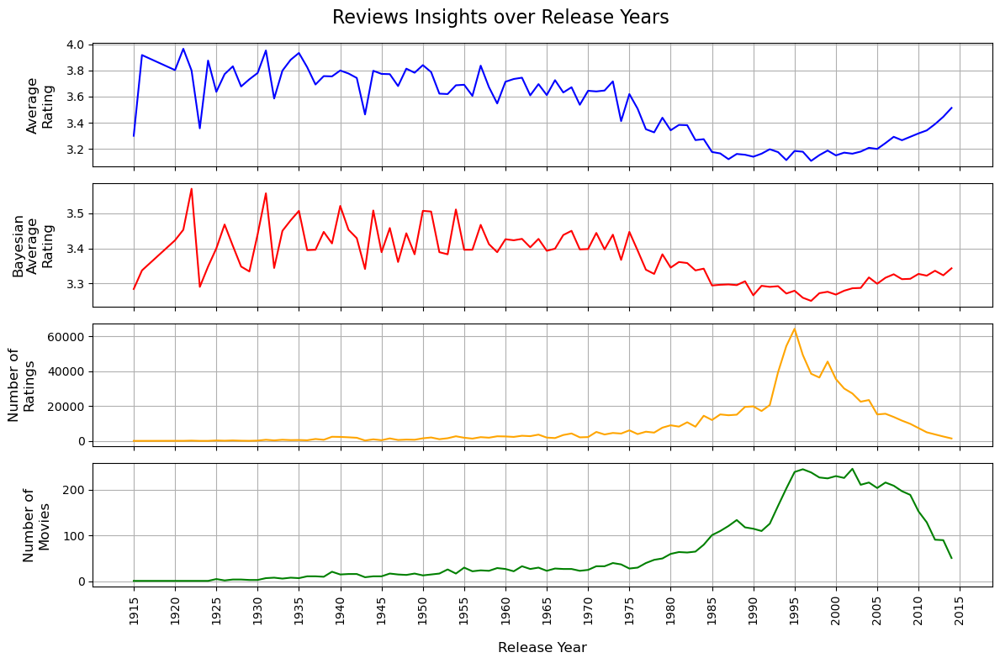

In [127]:
fig, axs = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

# Average Rating
sns.lineplot(data=yearly_info, x='release_year', y='average_rating_y', ax=axs[0], color='blue')
axs[0].set_ylabel('Average\nRating', fontsize=12, labelpad=10)
axs[0].grid()
axs[0].xaxis.set_major_locator(mdates.YearLocator(5))

# Bayesian Rating
sns.lineplot(data=yearly_info, x='release_year', y='Bayes_rating_y', ax=axs[1], color='red')
axs[1].set_ylabel('Bayesian\nAverage\nRating', fontsize=12, labelpad=10)
axs[1].grid()
axs[1].xaxis.set_major_locator(mdates.YearLocator(5))

# Number of Ratings
sns.lineplot(data=yearly_info, x='release_year', y='rating_count_y', ax=axs[2], color= 'orange')
axs[2].set_ylabel('Number of\nRatings', fontsize=12, labelpad=10)
axs[2].grid()
axs[2].xaxis.set_major_locator(mdates.YearLocator(5))
axs[2].tick_params(axis='x', rotation=90)
axs[2].set_xlabel('')

# Number of Movies
sns.lineplot(data=yearly_info, x='release_year', y='movie_count_y', ax=axs[3], color='green')
axs[3].set_ylabel('Number of\nMovies', fontsize=12, labelpad=10)
axs[3].grid()
axs[3].xaxis.set_major_locator(mdates.YearLocator(5))
axs[3].tick_params(axis='x', rotation=90)
axs[3].set_xlabel('Release Year', fontsize=12, labelpad=15)


fig.suptitle(
    'Reviews Insights over Release Years',
    fontsize=16
)
plt.tight_layout()

# Save figure
plt.savefig('images/review_insights_by_release_year.png', dpi=300, bbox_inches='tight')

plt.show()


**<u>Comments:</u>**  

Overall, we can observe that the Bayesian average rating is less inflated, reflecting the reduced impact of low popularity and small audience effects that can distort the simple average rating. Compared to the average rating, the Bayesian rating exhibits less fluctuation and slightly different scaling, particularly in periods with fewer viewers, such as movies released up to the 1980s and in the last five years. This difference is primarily due to limited exposure of certain movies, either because of historical scarcity or the recency of their release.

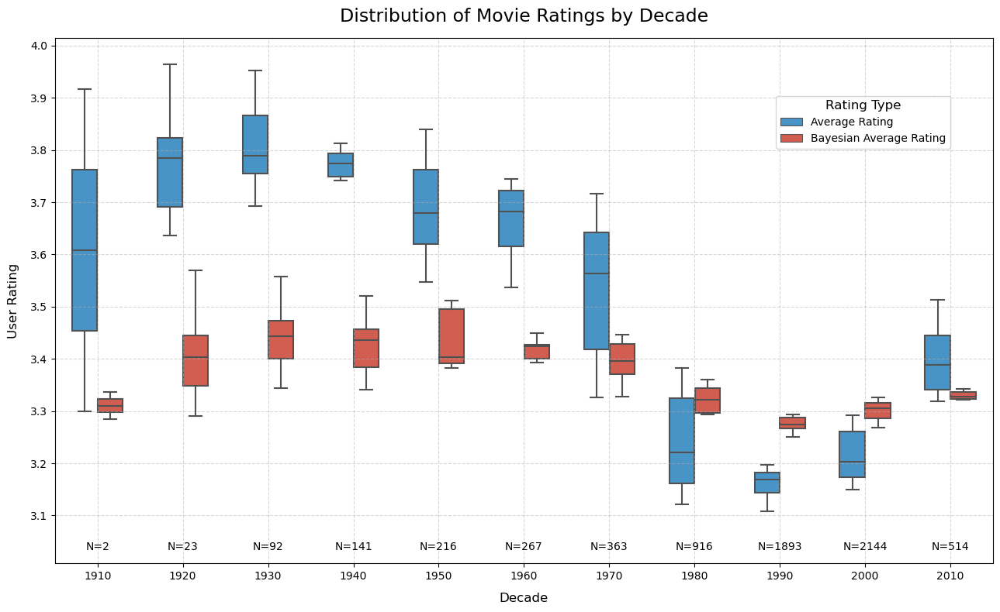

In [126]:
# Decade extraction
yearly_info['decade'] = (yearly_info['release_year'].dt.year // 10) * 10

# Reshape dataframe to long format
df_melt = yearly_info.melt(
    id_vars=['decade'],
    value_vars=['average_rating_y', 'Bayes_rating_y'],
    var_name='rating_type',
    value_name='rating'
)

# Map types of ratings
df_melt['rating_type'] = df_melt['rating_type'].map({
    'average_rating_y': 'Average Rating',
    'Bayes_rating_y': 'Bayesian Average Rating'
})

# Total number of movies per decade
movies_per_decade = yearly_info.groupby('decade')['movie_count_y'].sum().to_dict()

# Plot side-by-side boxplot
plt.figure(figsize=(13,8))
ax = sns.boxplot(
    data=df_melt,
    x='decade',
    y='rating',
    hue='rating_type',
    palette=['#3498db', '#e74c3c'],
    showfliers=False,
    width=0.6,    
    dodge=True   
)

# Number of movies per decade as annotation
for i, decade in enumerate(sorted(yearly_info['decade'].unique())):
    ax.text(
        i,               
        3.03,            
        f"N={movies_per_decade[decade]}",
        ha='center',
        va='bottom',
        fontsize=10,
        color='black'
    )

# FInal touches
plt.title('Distribution of Movie Ratings by Decade', fontsize=17, pad=15)
plt.xlabel('Decade', fontsize=12, labelpad=10)
plt.ylabel('User Rating', fontsize=12, labelpad=10)
ax.yaxis.set_major_locator(mticker.MultipleLocator(0.1))
plt.grid(linestyle='--', alpha=0.5)
plt.ylim(min(df_melt['rating']) - 0.1, max(df_melt['rating']) + 0.05)
plt.legend(title='Rating Type', fontsize=10, title_fontsize=12, bbox_to_anchor=(0.96, 0.9))
plt.tight_layout()
# save figure
plt.savefig('images/boxplot_ratings_by_decade.png', dpi=300, bbox_inches='tight')
plt.show()

**<u>Comments:</u>**  

As observed from the boxplots, the average rating within each decade exhibits a much wider spread across movies. This is particularly evident for rare or niche movies in the early years, whose ratings can be inflated or deflated due to the small number of viewers and the limited number of movies available. In contrast, the Bayesian average rating provides a more stable distribution, as it accounts for low review counts by pulling extreme values toward the overall mean.

Additionally, we can see that under the average rating, there appears to be a preference for older movies on average. However, this trend is much less pronounced when using the Bayesian average, as the credibility of reviews is adjusted according to the popularity of the movies. A slightly positive trend is still noticeable for movies from the 1920s, 1930s, and 1940s, but this is likely due to the higher quality of movies from that era that survived and reached audiences, compared to the full set of movies produced in more recent decades.


### <u>3.2 Multi-Hot encoding on genres</u>

Since our review dataframe contains only 19 distinct genres (plus one removed), multi-hot encoding is the optimal approach to represent movie genres. Multi-hot encoding is a simple yet effective technique that creates a binary vector for each movie, indicating the presence or absence of each genre. This method captures all genre information without introducing unnecessary model complexity, making it a widely used and interpretable solution in machine learning applications for representing multiple categorical factors simultaneously.

In [41]:
# Find distinct movie IDs present in the filtered ratings DataFrame and filter movie on it
filtered_movie_ids = ratings_df_f['movieId'].unique()
movies_df_f = movies_df[movies_df['movieId'].isin(filtered_movie_ids)].copy()

# Remove any movies that do not have genre information
movies_df_f = movies_df_f[movies_df_f['genres'] != '(no genres listed)'].copy()

# Create a list of genres for each movie by splitting the pipe-separated genre string
movies_df_f['genre_list'] = movies_df_f['genres'].str.split('|')

# Apply multi-hot encoding to the list of genres
mlb = MultiLabelBinarizer()
genre_multi_hot = mlb.fit_transform(movies_df_f['genre_list'])
genre_df = pd.DataFrame(genre_multi_hot, columns=mlb.classes_)

# Concatenate the multi-hot encoded genre columns with the movies DataFrame
movies_df_f = pd.concat([movies_df_f, genre_df], axis=1)
movies_df_f.head(2)


,movieId,title,genres,genre_list,Action,Adventure,Animation,Children,Comedy,Crime,...,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1.0,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,"[Adventure, Animation, Children, Comedy, Fantasy]",0.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,Jumanji (1995),Adventure|Children|Fantasy,"[Adventure, Children, Fantasy]",0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
